# Louvain algorithm

### Import

In [8]:
import os
import pickle
import networkx as nx
import community as community_louvain
import numpy as np
import matplotlib.cm as cm
import matplotlib.pyplot as plt
from collections import Counter, defaultdict
from google.colab import drive

# graph files folder
drive.mount('/content/drive')
graph_files = '/content/drive/My Drive/covid_project/graph_files'
community_detection = '/content/drive/My Drive/covid_project/community_detection'


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Main

In [10]:
''' Print communities '''
def print_communities(communities):

  output = []
  for c in communities:
    if communities[c] not in output:
      output.append(communities[c])

  print(output)
  #print(communities)

# Load graph
g = nx.read_gpickle(graph_files+"/graph.pickle")
G1 = nx.Graph(g)

print("NUMBER OF EDGES = " + str(len(G1.edges)))
print("NUMBER OF NODES = " + str(len(G1.nodes)))

# Louvain algorithm
print("\nLOUVAIN")
communities1 = community_louvain.best_partition(G1)
n_communities1 = len(set(communities1.values()))

print(f"communities: {n_communities1}")
print_communities(communities1)

# Statistics over communities
com = Counter(communities1.values())

# Extract community with more than 50 nodes
node_sum = 0
z = 0
largest_com = {}
for c in com:
  if com[c] > 50:
    node_sum += com[c]
    largest_com[c] = com[c]        
    z += 1
    print(str(c) + ":" + str(com[c]))

print("\nNumber of communities with more than 50 nodes = " + str(z))
print("\nTotal node = " + str(node_sum))

# AVERAGE CLUSTERING COEFFICENT
c_coefficent = nx.clustering(G1)
sum = 0
tot = 0
for key in c_coefficent:
    sum += c_coefficent[key]
    tot += 1

print("\nAVERAGE CLUSTERING COEFFICENT = " + str(sum / tot))

with open(community_detection+"/communities.pickle", "wb") as f:
    pickle.dump(communities1, f)

NUMBER OF EDGES = 441707
NUMBER OF NODES = 10162

LOUVAIN
communities: 39
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38]
0:274
1:469
2:257
3:1577
4:793
5:587
6:990
8:1240
9:821
10:955
11:182
13:407
14:277
15:169
16:229
17:214
19:388
21:57

Number of communities with more than 50 nodes = 18

Total node = 9886

AVERAGE CLUSTERING COEFFICENT = 0.7613322629146598


### Plot graph

Nodes in the 3 largest community = 3807


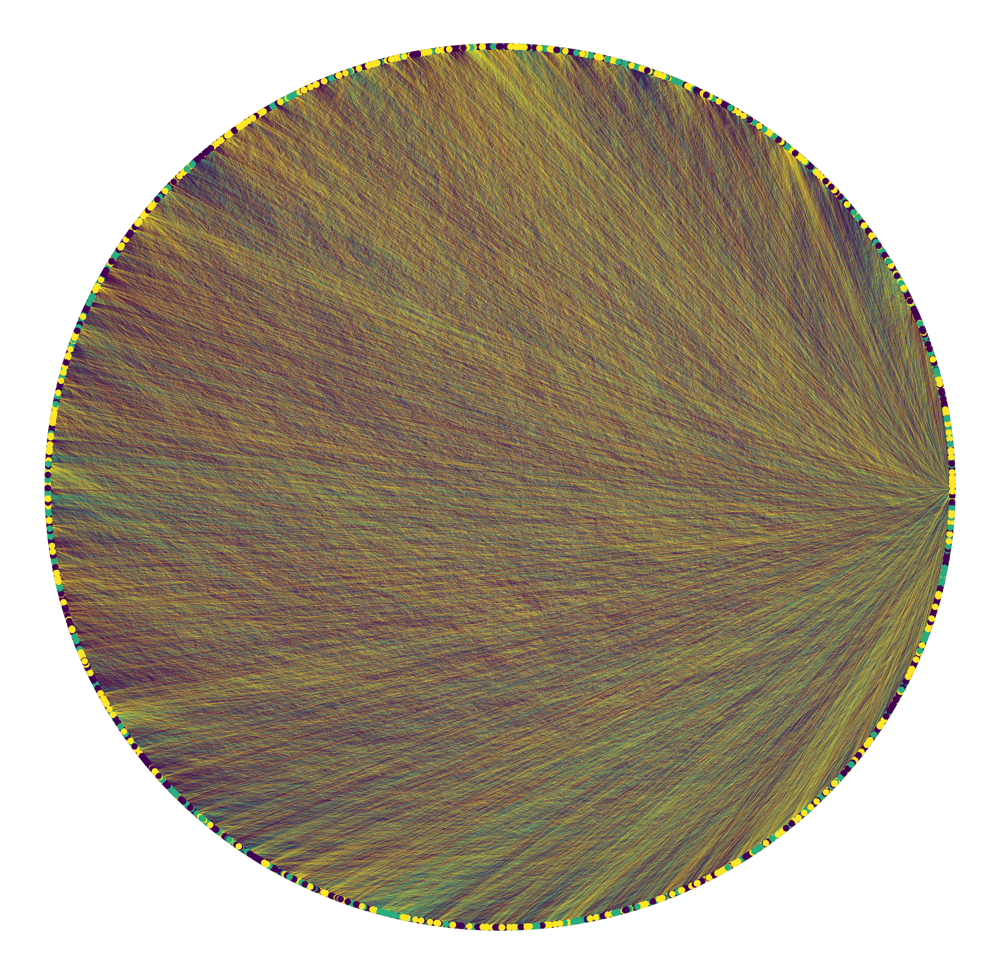

In [11]:
# Extract the 3 largest community
tmp = {k: v for k, v in sorted(largest_com.items(), key=lambda item: item[1])}
largest_com_3 = [list(tmp.keys())[len(tmp)-1], list(tmp.keys())[len(tmp)-2], list(tmp.keys())[len(tmp)-3]]
largest_com_nodes = []
not_largest = []
count = 0
for c in communities1:
  if communities1[c] in largest_com_3:
    count += 1
    largest_com_nodes.append(c)
  else: not_largest.append(c)

for i in not_largest:
  del communities1[i]

print("Nodes in the 3 largest community = " + str(count))

# DRAWING GRAPH FOR THE 3 LARGEST COMMUNITY
subG = G1.subgraph(largest_com_nodes)

cmap = cm.get_cmap('viridis', max(communities1.values()) + 1)

plt.figure(figsize=(50,50))
# draw the graph
pos = nx.circular_layout(subG)
# color the nodes according to their partition
cmap = cm.get_cmap('viridis', max(communities1.values()) + 1)
nx.draw_networkx_nodes(subG, pos, communities1.keys(), node_size=300,
                       cmap=cmap, node_color=list(communities1.values()))
edge_colors = [communities1[edge[0]] for edge in subG.edges()]
nx.draw_networkx_edges(subG, 
                       pos, 
                       alpha=0.5,
                       width=0.5,
                      edge_color=edge_colors)
plt.box(False)
